In [12]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [13]:
import numpy as np
import numpy.random as npr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.model_selection import KFold
import pickle
from scipy import stats


from imports import *
from config import dir_config
from src.utils import pmf_utils, glm_hmm_utils
from src.utils.glm_hmm_utils_cv import cross_validation_split


In [14]:
processed_dir = Path(dir_config.data.processed)
glm_hmm_dir = Path(processed_dir, "glm_hmm_models")

glm_hmm_model_name = "with_bias_no_color_1_back_prev_choice_coherence"

In [15]:
with open(Path(glm_hmm_dir, f"{glm_hmm_model_name}.pkl"), "rb") as f:
    glm_hmm = pickle.load(f)
glm_hmm_config = glm_hmm["config"]

### Helper functions

In [16]:
def get_expected_state_choice_prob(model, data_df, choices, input, mask, stimulus, trial_indices):

    transition_matrix = model.transitions.params
    transition_matrix = np.exp(transition_matrix)[0]
    weights = -model.observations.params
    posterior_probs, weighted_sum = [], []
    for idx in trial_indices:
        posterior_probs.append(model.expected_states(data=choices[idx], input=input[idx], mask=np.array(mask[idx]).reshape(-1, 1))[0])
        weighted_sum.append(np.sum(weights * input[idx][None, :, :], axis=-1).T)
    sigmoid_output = 1 / (1 + np.exp(-np.concatenate(weighted_sum)))
    glm_hmm_expected_choice_prob = np.sum(sigmoid_output * np.concatenate(posterior_probs), axis=1, keepdims=True)

    posterior_cols = [f"posterior_probs_state_{i}" for i in range(1,1+np.concatenate(posterior_probs).shape[1])]

    df = pd.DataFrame(
        data=np.hstack(
            (
                np.concatenate(trial_indices).reshape(-1, 1),  # shape (n_trials, 1)
                np.concatenate(posterior_probs),  # shape (n_trials, n_states)
                glm_hmm_expected_choice_prob,  # shape (n_trials, 1)
                mask[np.concatenate(trial_indices)].values.reshape(-1, 1),  # shape (n_trials, 1)
                choices[np.concatenate(trial_indices)].reshape(-1, 1),  # shape (n_trials, 1)
                stimulus[np.concatenate(trial_indices)].values.reshape(-1, 1),  # shape (n_trials, 1)
            )
        ),
        columns=["trial_idx"] + posterior_cols + ["expected_choice_prob"] + ["mask"] + ["choices"] + ["stimulus"]
    )

    for var in glm_hmm_config["model_features"]:
        df[var] = data_df[var].values.reshape(-1, 1)[np.concatenate(trial_indices)]
    df["color"] = df["color"].apply(lambda x: 0 if x < 0.5 else 1)

    df = df[df["mask"] == 1]  # include valid trials only
    df = df.drop(columns=["mask"])

    return df

In [17]:
def plot_psych(predicted_df, ax, n_sample=10):
    # plot equal and unequal psychometric fits
    equal_indices = predicted_df["color"] == 0
    unequal_indices = predicted_df["color"] == 1

    for indices, color, label in zip([equal_indices, unequal_indices], ["#377eb8", "#974810"], ["Equal", "Unequal"]):
        stimulus = predicted_df["stimulus"][indices]
        choices = predicted_df["choices"][indices]
        expected_choice_probs = predicted_df["expected_choice_prob"][indices]

        data = {"signed_coherence": np.array(stimulus) * 100, "choice": choices}
        x_data, y_data, _, x_model, y_model = pmf_utils.get_psychometric_data(data)

        x_model_hat, y_model_hat = np.full((n_sample, len(x_model)), np.nan), np.full((n_sample, len(y_model)), np.nan)

        for idx_sample in range(n_sample):
            data_fitted = {"signed_coherence": np.array(stimulus) * 100, "choice": npr.binomial(1, expected_choice_probs)}
            x_data, _, _, x_model_hat[idx_sample, :], y_model_hat[idx_sample, :] = pmf_utils.get_psychometric_data(data_fitted)

        ax.plot(x_data, y_data, "o", color=color)

        ax.plot(x_model, y_model, color=color, label=label)
        ax.plot(np.mean(x_model_hat, axis=0), np.mean(y_model_hat, axis=0), color=color, linestyle="--")
        ax.fill_between(np.mean(x_model_hat, axis=0), np.mean(y_model_hat, axis=0) - np.std(y_model_hat, axis=0), np.mean(y_model_hat, axis=0) + np.std(y_model_hat, axis=0), color=color, alpha=0.3)

    ax.set_xlim(min(x_data), max(x_data))
    ax.set_ylim(0, 1)
    ax.set_xlabel("Coherence")
    ax.set_ylabel("choices toRF")
    ax.set_title("Psychometric fits", fontsize=15)
    ax.legend()


In [18]:
def plot_state_prob(predicted_df, task_switch, ax):
    color = ["#ff7f00", "#4daf4a", "#377eb8"]
    # find out number of columns start with posterior_probs_state_
    posterior_cols = [col for col in predicted_df.columns if col.startswith("posterior_probs_state_")]
    for col_idx, col in enumerate(posterior_cols):
        ax.scatter(predicted_df["trial_idx"], predicted_df[col], s=1, color=color[col_idx])
        ax.plot([], [], color=color[col_idx], label=f"State {col_idx + 1}")
    ax.set_xlabel("Trial #")
    ax.set_ylabel("Posterior Probability")
    ax.set_title("State Posterior Probabilities", fontsize=15)
    ax.vlines(task_switch, ymin=-0.1, ymax=1.1, color="k", alpha=0.5, ls="--")
    ax.set_ylim(-0.1, 1.1)
    ax.legend()


In [19]:
def plot_model_params(model, axs):
    """
    Plot the model parameters: GLM weights and transition matrix.
    """
    color = ["#ff7f00", "#4daf4a", "#377eb8"]  # Colors for the states
    transition_matrix = model.transitions.params
    transition_matrix = np.exp(transition_matrix)[0]
    weights = -model.observations.params

    # Plot GLM weights
    for idx in range(weights.shape[0]):
        axs.plot(np.arange(weights.shape[2]), weights[idx][0], marker="o", color=color[idx], linestyle="-", lw=1.5, label=f"State {idx + 1}")

    axs.tick_params(axis="y", labelsize=10)
    axs.set_ylabel("GLM weight", fontsize=15)
    axs.set_xlabel("covariate", fontsize=15)
    axs.set_xticks(range(len(glm_hmm_config["model_features"])))
    axs.set_xticklabels(glm_hmm_config["model_features"], fontsize=12, rotation=15)

    axs.axhline(y=0, color="k", alpha=0.5, ls="--")
    axs.legend()
    axs.set_title("GLM weights", fontsize=15)


### Get train/test  split for each session

In [20]:
for key, model in glm_hmm.items():
    if key in ["config"]:
        continue

    train_indices, test_indices = {}, {}
    train_best_fold = {}
    for idx_session, session_id in enumerate(model["data"].keys()):
        train_best_fold[session_id] = np.argmax(model["session_wise"]["test_ll"][idx_session, model["best_state_idx"], :])
        choices = model["data"][session_id]["choices"]
        train_indices[session_id], test_indices[session_id] = cross_validation_split(len(choices), idx_split=train_best_fold[session_id])

    glm_hmm[key]["train_best_fold"] = train_best_fold
    glm_hmm[key]["train_indices"] = train_indices
    glm_hmm[key]["test_indices"] = test_indices

In [21]:
def get_session_predicted_df(model, session_id, idx_session=None, indices_type=all):
    if indices_type == "all":
        trial_indices = [np.arange(len(model["data"][session_id]["choices"]))]
        session_model = model["models"][session_id]
    elif indices_type == "train":
        session_model = model["session_wise"]["models"][idx_session][model["best_state"]][model["train_best_fold"][session_id]]
        trial_indices = model["train_indices"][session_id]
    elif indices_type == "test":
        session_model = model["session_wise"]["models"][idx_session][model["best_state"]][model["train_best_fold"][session_id]]
        trial_indices = model["test_indices"][session_id]

    predicted_df = get_expected_state_choice_prob(
        model=session_model,
        data_df=model["data"][session_id],
        choices=model["data"][session_id]["choices"].values.reshape(-1, 1),
        input=np.array(model["data"][session_id][glm_hmm_config["model_features"]]),
        mask=model["data"][session_id]["mask"],
        stimulus=model["data"][session_id]["stimulus"],
        trial_indices=trial_indices,
    )

    return session_model, session_id, predicted_df


## Model fits and data recovery (train and test)

### Train Dataset

#### Psychometric Fits, GLM weights, transition matrix, p(state)

Processing on_meds sessions...


KeyError: 'color'

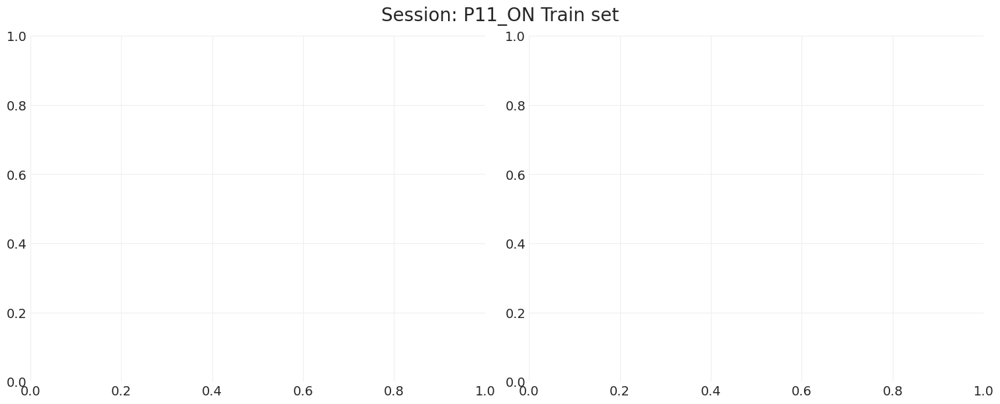

In [22]:
indices_type = "train"  # "train" or "test" or "all"

for key, model in glm_hmm.items():
    if key in ["config"]:
        continue
    print(f"Processing {key} sessions...")
    for idx_session, session_id in enumerate(model["data"].keys()):
        fig, axs = plt.subplots(1, 2, figsize=(15, 6))
        plt.suptitle(f"Session: {session_id} {indices_type.capitalize()} set", fontsize=20)

        session_model, session_id, predicted_df = get_session_predicted_df(model, session_id, idx_session, indices_type=indices_type)
        plot_psych(predicted_df, axs[0])
        plot_model_params(session_model, axs[1])


### Test Dataset

Processing on_meds sessions...
Processing off_meds sessions...


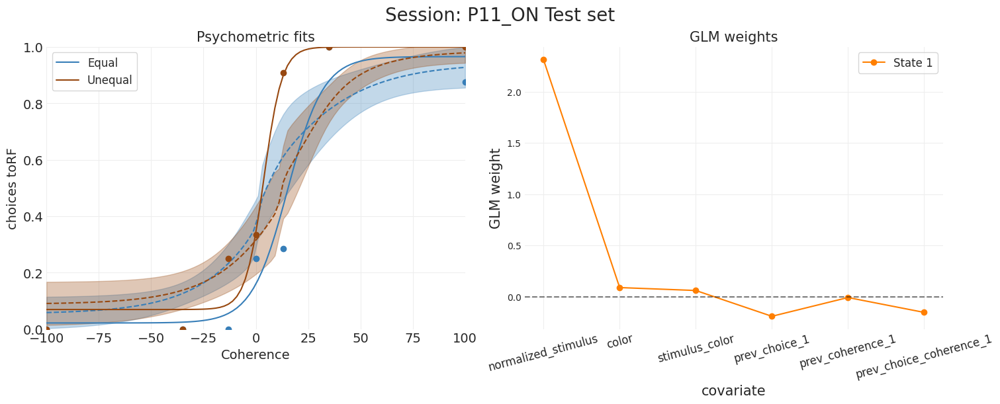

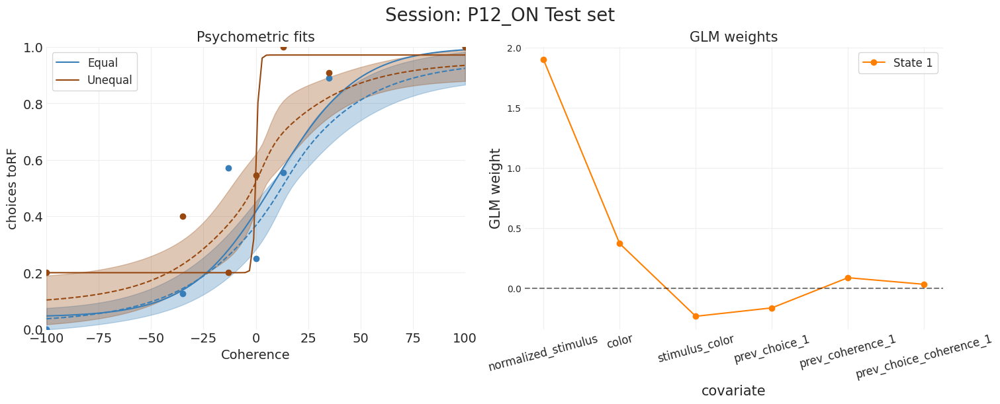

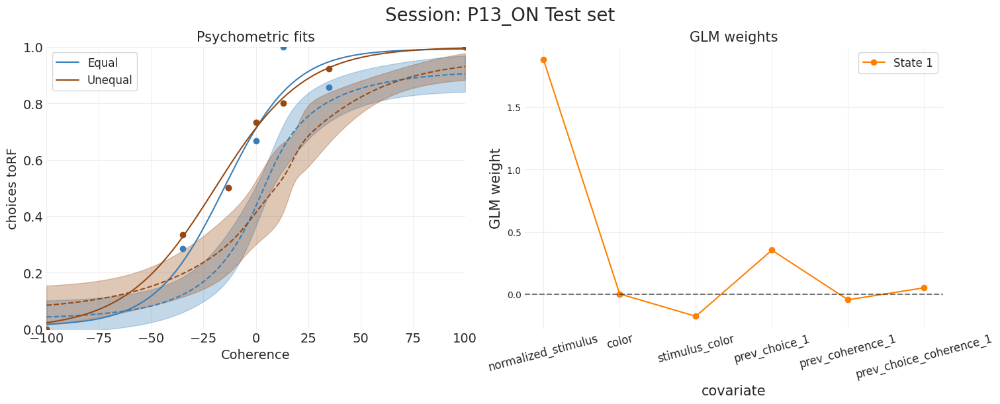

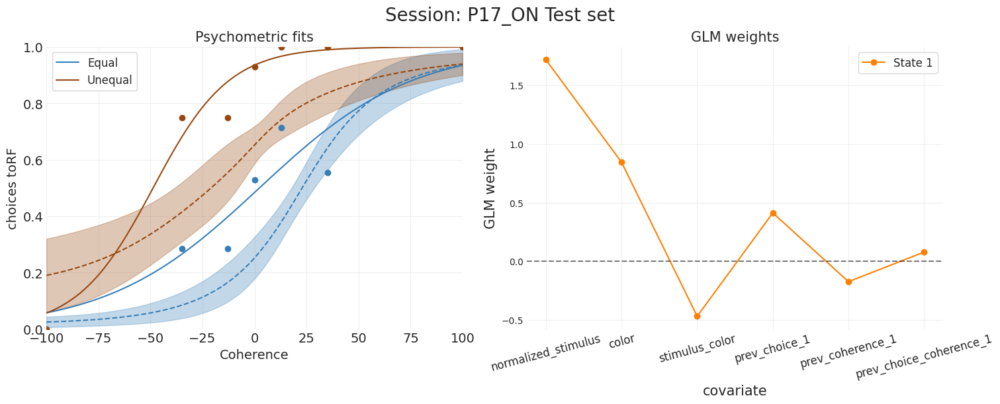

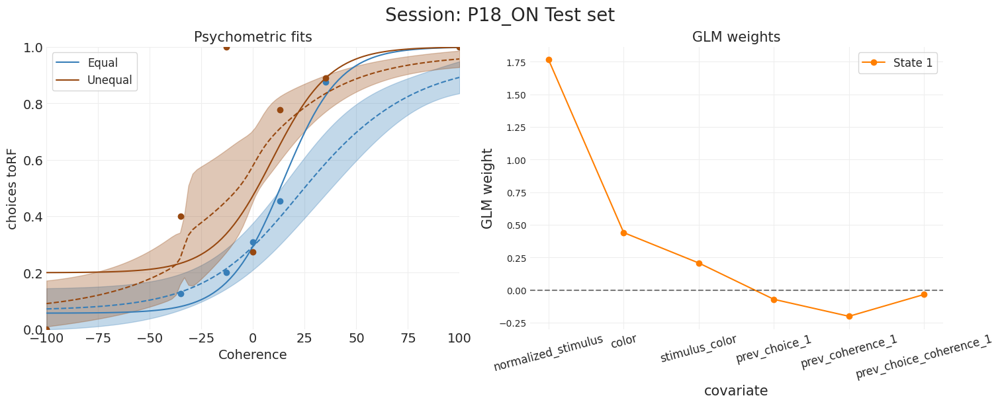

...

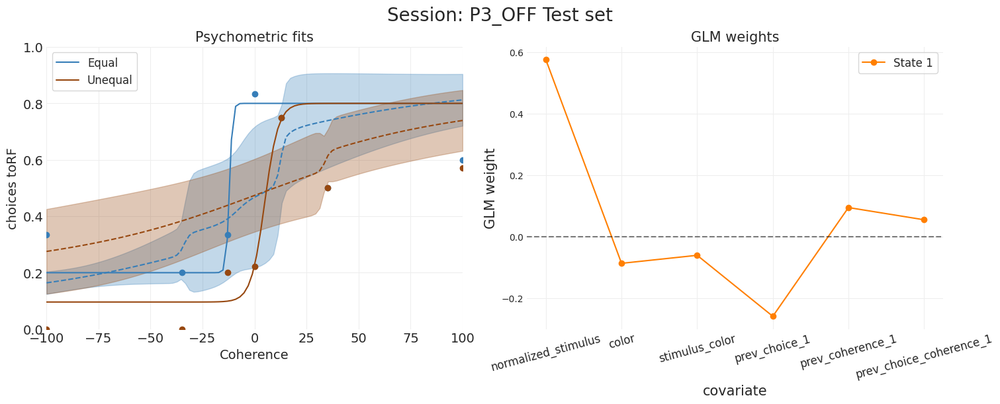

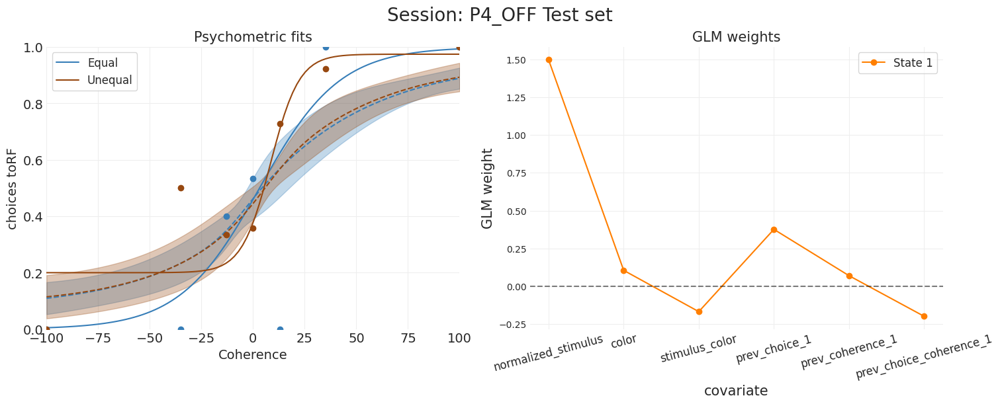

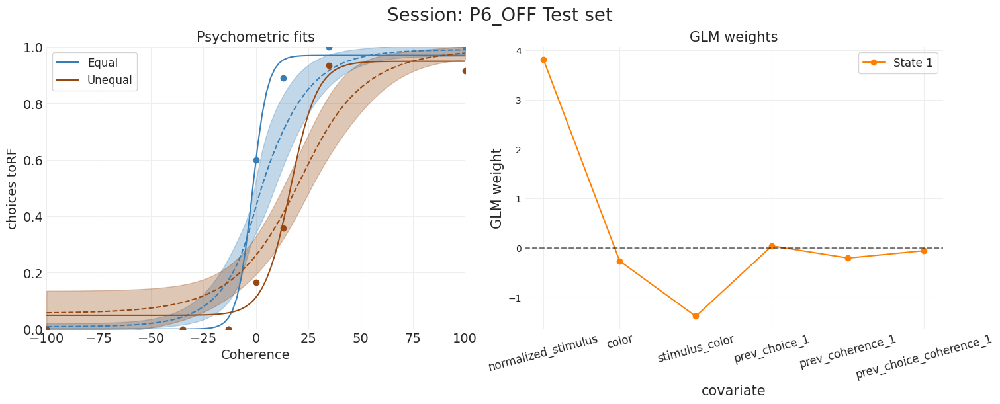

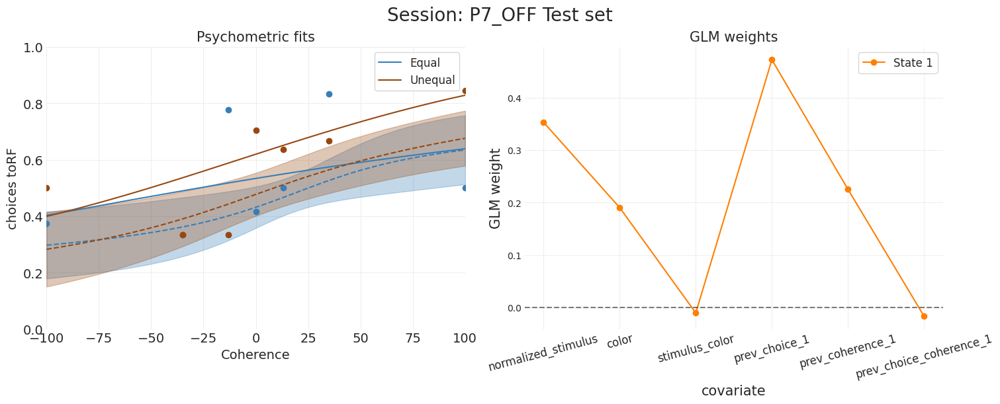

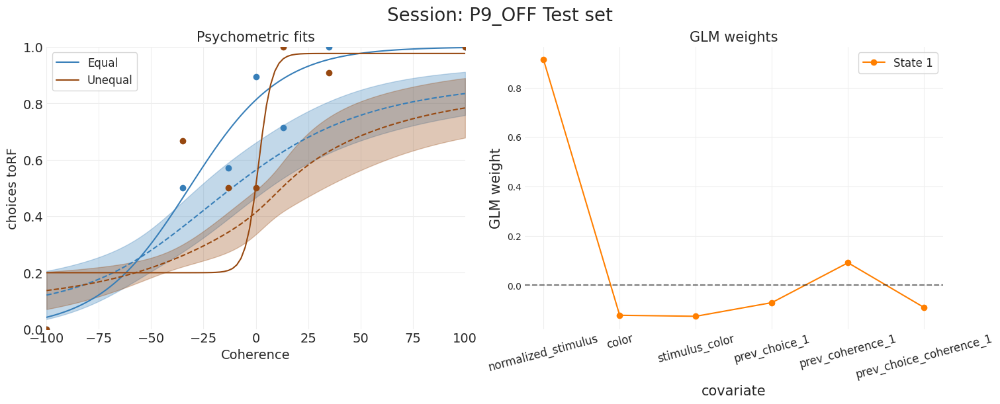

In [ ]:
indices_type = "test"  # "train" or "test" or "all"

for key, model in glm_hmm.items():
    if key in ["config"]:
        continue
    print(f"Processing {key} sessions...")
    for idx_session, session_id in enumerate(model["data"].keys()):
        fig, axs = plt.subplots(1, 2, figsize=(15, 6))
        plt.suptitle(f"Session: {session_id} {indices_type.capitalize()} set", fontsize=20)

        session_model, session_id, predicted_df = get_session_predicted_df(model, session_id, idx_session, indices_type=indices_type)
        plot_psych(predicted_df, axs[0])
        plot_model_params(session_model, axs[1])


# Fit on whole session and save model

In [ ]:
final_model_dict = {"config": glm_hmm_config}

In [ ]:
# get parameter initializations for each session
init_params = {"glm_weights": {}, "transition_matrices": {}}
choices_session_wise, inputs_session_wise, masks_session_wise = [], [], []

for key, model in glm_hmm.items():
    if key in ["config"]:
        continue

    print(f"Processing {key} sessions...")
    print(f"Number of sessions: {len(model['data'].keys())}")

    init_params = {"glm_weights": {}, "transition_matrices": {}}
    choices_session_wise, inputs_session_wise, masks_session_wise = [], [], []
    for idx_session, session_id in enumerate(model["data"].keys()):
        session_model = model["session_wise"]["models"][idx_session][model["best_state"]][model["train_best_fold"][session_id]]
        init_params["glm_weights"][idx_session] = session_model.observations.params
        init_params["transition_matrices"][idx_session] = session_model.transitions.params

        choices_session_wise.append(model["data"][session_id]["choices"].values.reshape(-1, 1))
        inputs_session_wise.append(np.array(model["data"][session_id][glm_hmm_config["model_features"]]))
        if model["data"][session_id]["mask"] is None:
            masks_session_wise.append(np.ones_like(choices_session_wise[-1], dtype=bool))
        else:
            masks_session_wise.append(model["data"][session_id]["mask"].values.reshape(-1, 1))

    session_models, session_fit_lls = glm_hmm_utils.session_wise_fit(choices_session_wise, inputs_session_wise, masks=masks_session_wise, n_sessions=len(choices_session_wise), init_params=init_params, n_states=model["best_state"], n_iters=2500)

    models_session_wise, fit_lls_session_wise = {}, {}
    for idx_session, session_id in enumerate(model["data"].keys()):
        models_session_wise[session_id] = session_models[idx_session]
        fit_lls_session_wise[session_id] = session_fit_lls[idx_session]


    final_model_dict[key] = {"models": models_session_wise, "fit_lls": fit_lls_session_wise, "data": model["data"], "best_state": model["best_state"]}


Converged to LP: -341.5:   0%|          | 2/2500 [00:00<00:11, 217.15it/s]


Processing on_meds sessions...
Number of sessions: 22


Fitting sessions: 100%|██████████| 22/22 [00:00<00:00, 323770.84it/s]

Processing off_meds sessions...
Number of sessions: 22



Fitting sessions: 100%|██████████| 22/22 [00:00<00:00, 263641.97it/s]


In [ ]:
with open(Path(glm_hmm_dir, f"{glm_hmm_model_name}_final.pkl"), "wb") as f:
    pickle.dump(final_model_dict, f)

### Final Model Fits and Params

In [ ]:
with open(Path(glm_hmm_dir, f"{glm_hmm_model_name}_final.pkl"), "rb") as f:
    glm_hmm_final = pickle.load(f)
glm_hmm_config = glm_hmm_final["config"]


Processing on_meds sessions...
Processing off_meds sessions...


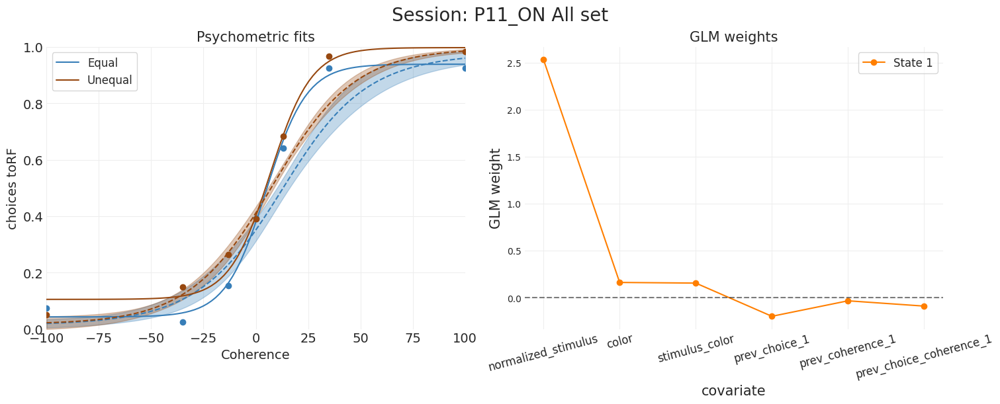

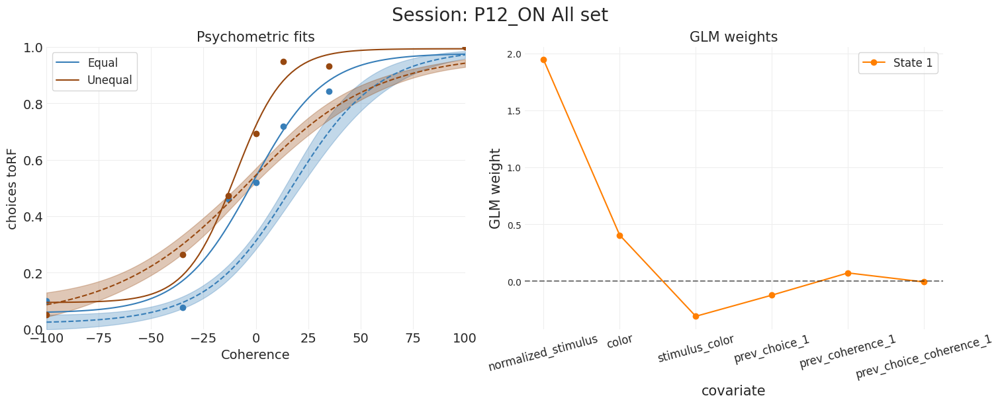

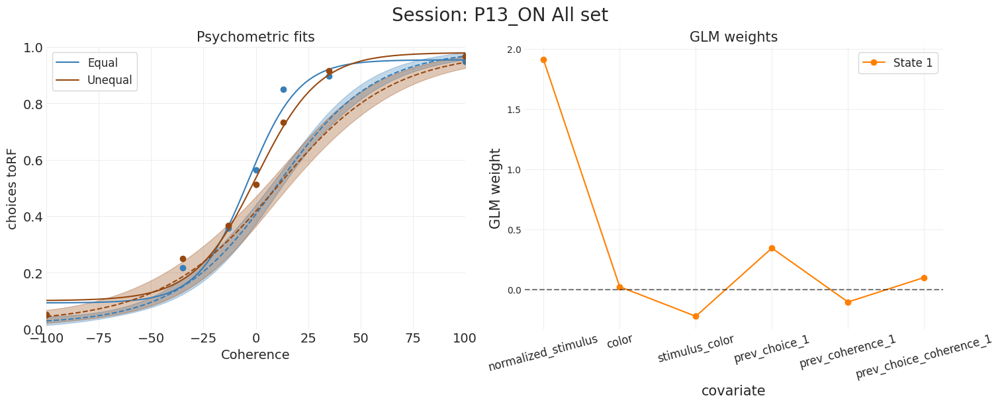

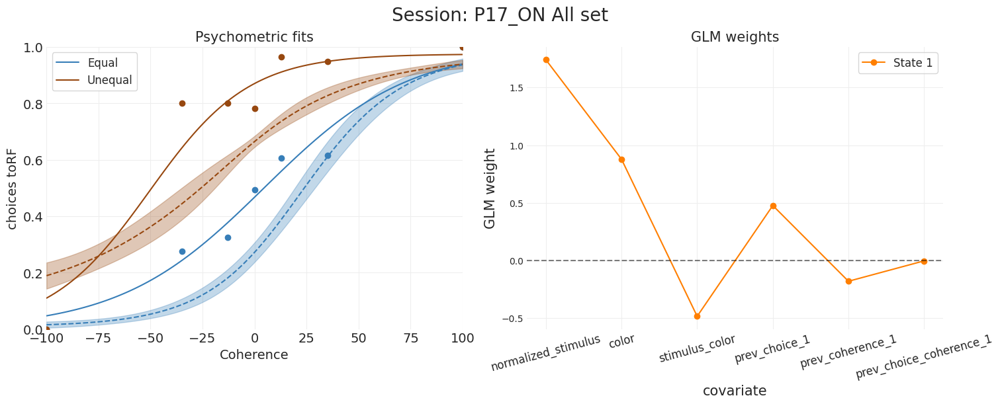

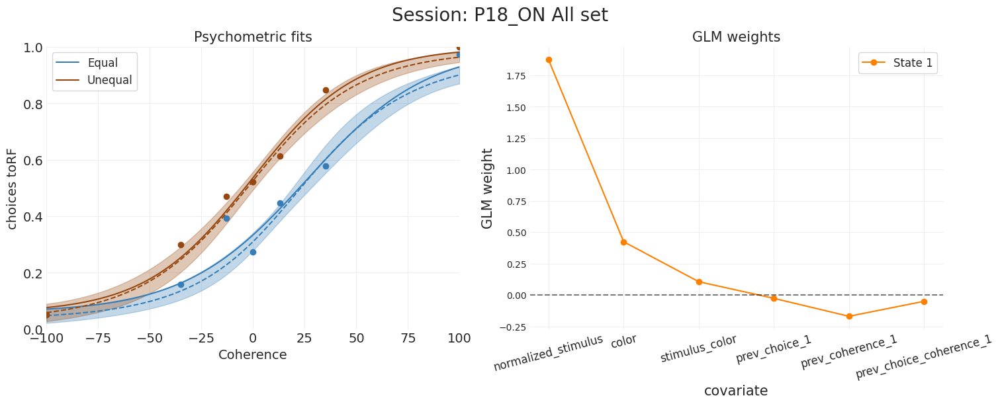

...

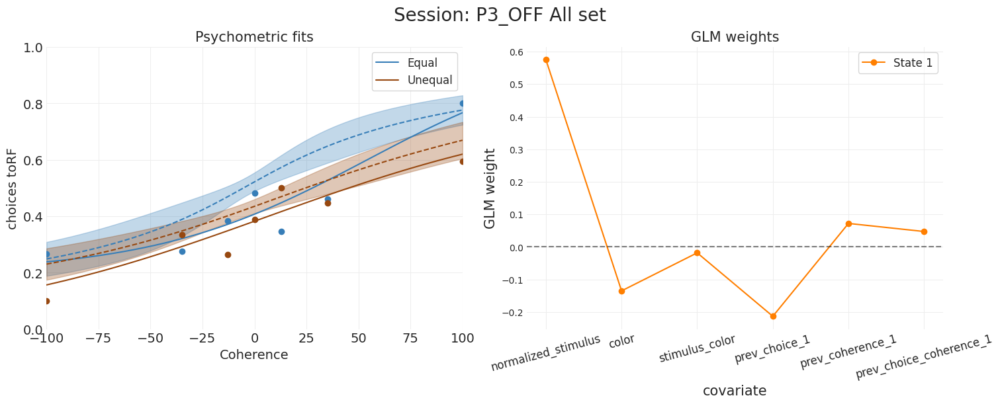

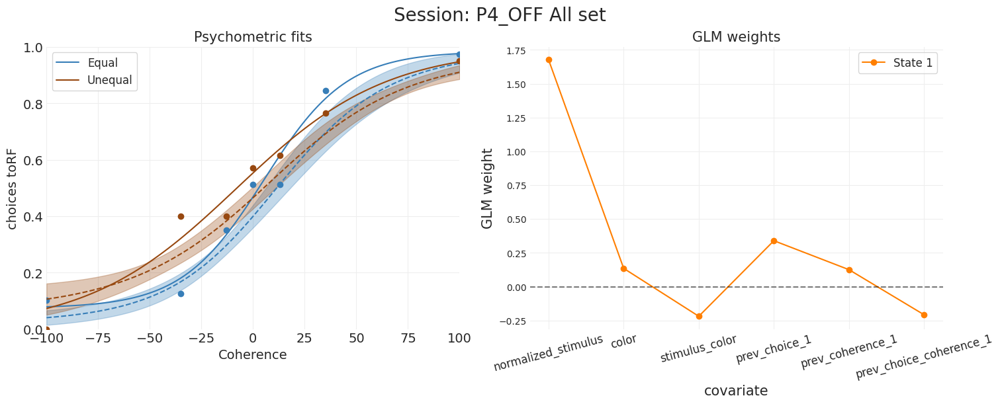

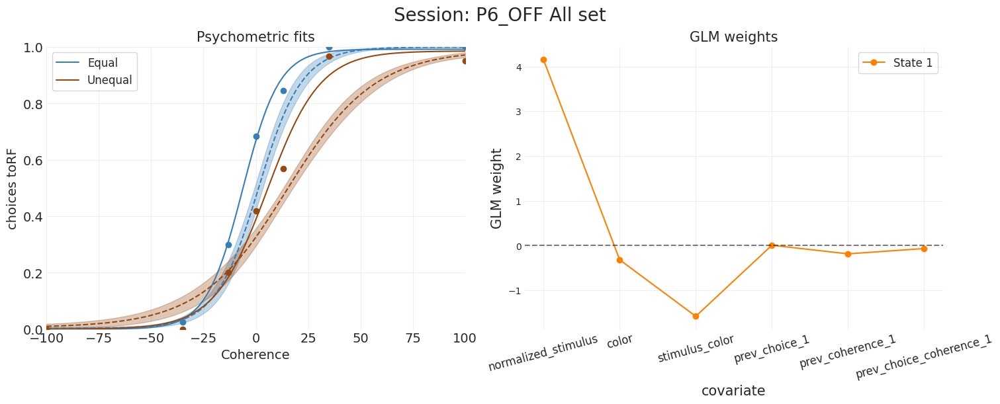

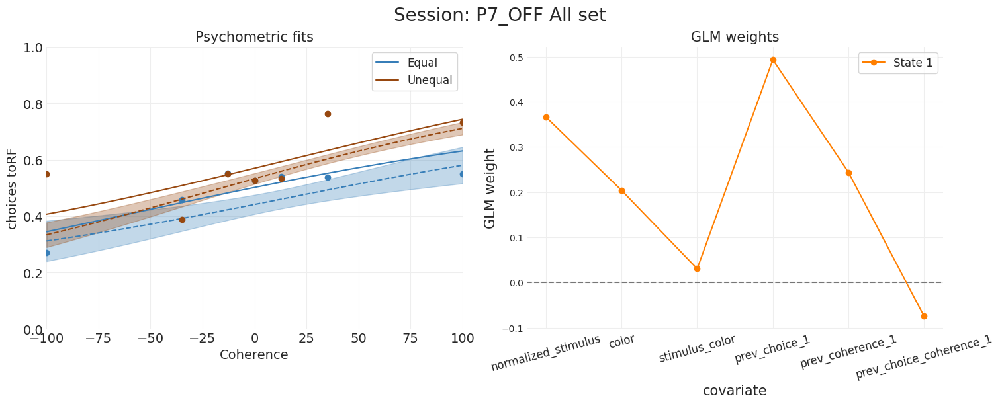

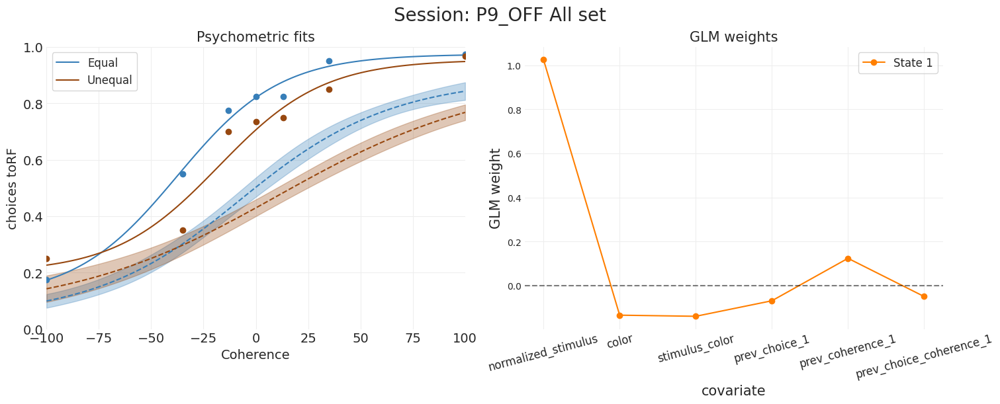

In [ ]:
indices_type = "all"  # "train" or "test" or "all"

for key, model_n_data in glm_hmm_final.items():
    if key in ["config"]:
        continue

    print(f"Processing {key} sessions...")
    for idx_session, session_id in enumerate(model_n_data["data"].keys()):
        fig, axs = plt.subplots(1, 2, figsize=(15, 6))
        plt.suptitle(f"Session: {session_id} {indices_type.capitalize()} set", fontsize=20)

        session_model, session_id, predicted_df = get_session_predicted_df(model_n_data, session_id, indices_type=indices_type)
        plot_psych(predicted_df, axs[0])
        plot_model_params(session_model, axs[1])


Processing on_meds sessions...
Number of sessions: 22
Processing off_meds sessions...
Number of sessions: 22


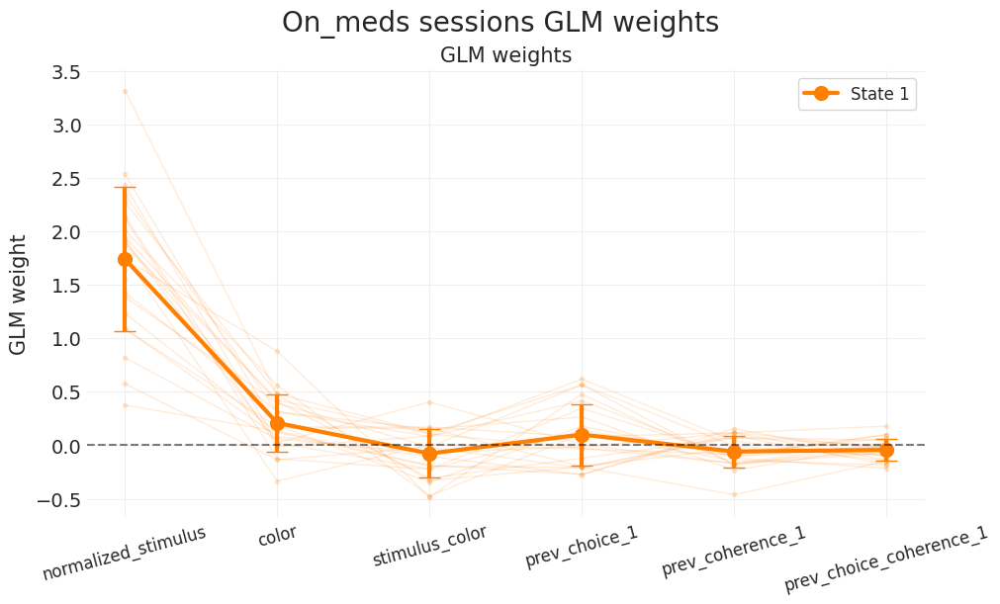

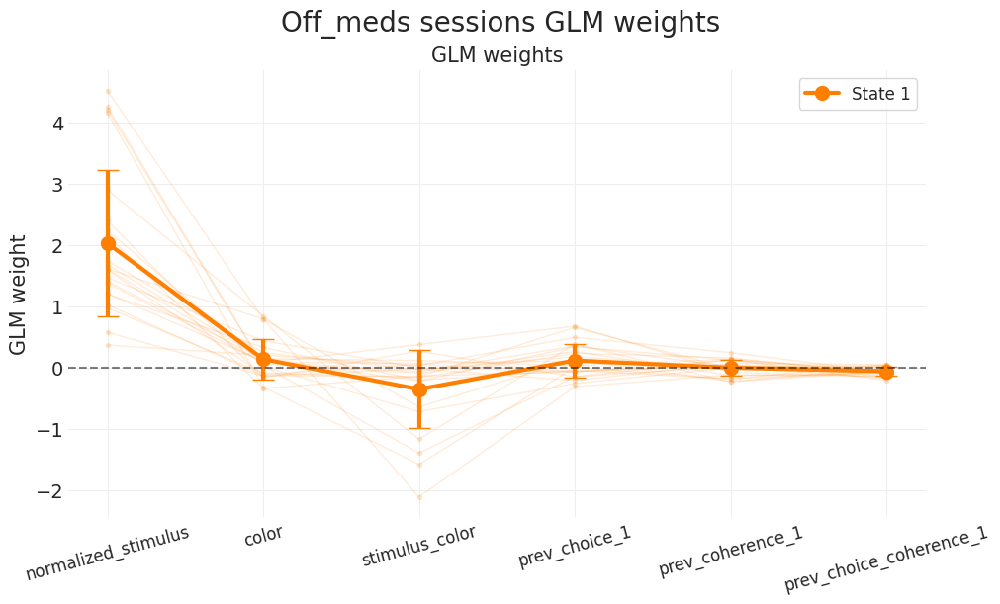

In [ ]:
for key, model_n_data in glm_hmm_final.items():
    if key in ["config"]:
        continue

    best_state = model_n_data["best_state"]
    print(f"Processing {key} sessions...")
    print(f"Number of sessions: {len(model_n_data['data'].keys())}")
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    plt.suptitle(f"{key.capitalize()} sessions GLM weights", fontsize=20)
    colors = ["#ff7f00", "#4daf4a", "#377eb8"]  # Colors for the states
    labels = [f"State {i+1}" for i in range(best_state)]
    glm_weights_session_wise = []
    for idx_session, session_id in enumerate(model_n_data["data"].keys()):
        model = model_n_data["models"][session_id]
        glm_weights = -np.array(model.observations.params).reshape(best_state, -1)
        glm_weights_session_wise.append(glm_weights)
        for k in range(best_state):
            ax.plot(np.arange(len(glm_hmm_config["model_features"])), glm_weights[k], marker="o", color=colors[k], linestyle="-", markersize=3, lw=1, alpha=0.15)
    for k in range(best_state):
        mean_weights = np.mean(np.array(glm_weights_session_wise), axis=0)
        std_weights = np.std(np.array(glm_weights_session_wise), axis=0)
        ax.errorbar(np.arange(len(glm_hmm_config["model_features"])), mean_weights[k], yerr=std_weights[k], fmt="o", color=colors[k], markersize=5, lw=1.5, capsize=8, elinewidth=3)
        ax.plot(np.arange(len(glm_hmm_config["model_features"])), np.mean(np.array(glm_weights_session_wise), axis=0)[k], marker="o", color=colors[k], linestyle="-", markersize=10, lw=3, label=labels[k])
    ax.set_xticks(range(len(glm_hmm_config["model_features"])))
    ax.set_xticklabels(glm_hmm_config["model_features"], fontsize=12, rotation=15)
    ax.set_ylabel("GLM weight", fontsize=15)
    ax.axhline(y=0, color="k", alpha=0.5, ls="--")
    ax.legend()
    ax.set_title("GLM weights", fontsize=15)